
# Processing data example using **Rasterio**, **geopandas** and **earthpy** libraires

* This notebook opens the data downloaded using the **Data Downloader notebook**
* If you are just opening the notebook, please make sure your bucket is mounted and the imagery can be accessed.
* Remember to change the quantity of bands and combinations if you are working with imagery other than Sentinel 2.

In [1]:
import os

import earthpy as et
import earthpy.plot as ep
import earthpy.spatial as es
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import rasterio as rio
from IPython.display import clear_output

clear_output(wait=True)

In [2]:
## Here we get the data from mount, which hosts the bucket where we transferred our data
with rio.open("mount/San_Diego_All_Bands3.tif") as src:
    naip_csf = src.read()
    naip_csf_meta = src.meta

In [3]:
naip_csf.shape

(13, 596, 863)

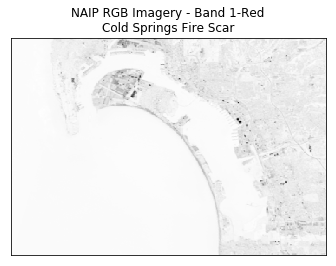

In [4]:
fig, ax = plt.subplots()
ax.imshow(naip_csf[0], cmap="Greys")
ax.set(
    title="NAIP RGB Imagery - Band 1-Red\nCold Springs Fire Scar", xticks=[], yticks=[]
)
plt.show()

(<Figure size 1728x864 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e4d46e48>)

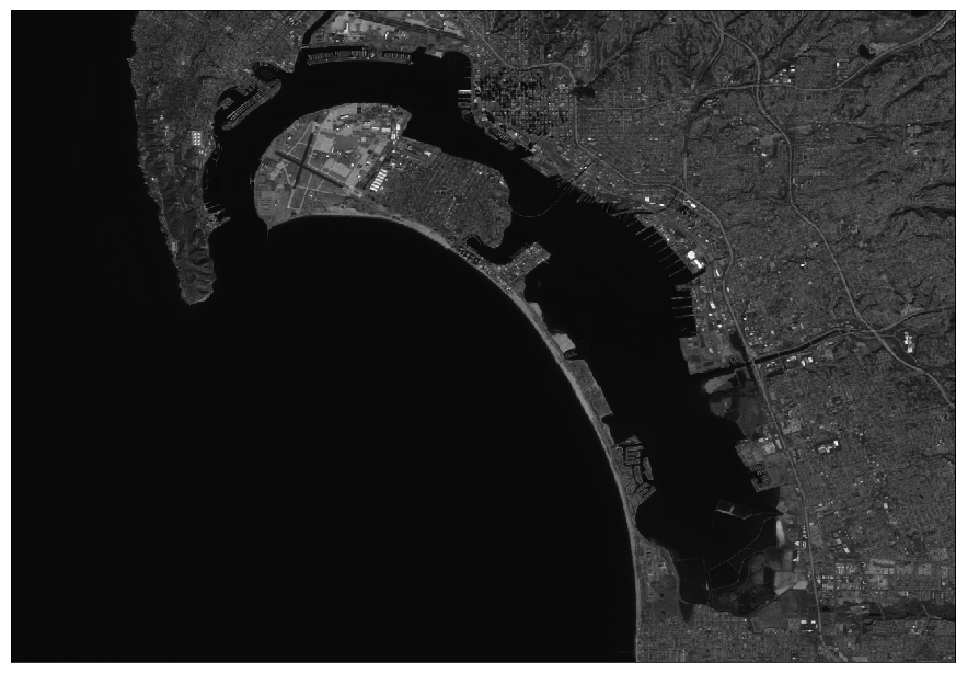

In [25]:
ep.plot_bands(naip_csf[4], figsize=(24, 12))

(<Figure size 864x864 with 15 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f44e54726a0>,
       dtype=object))

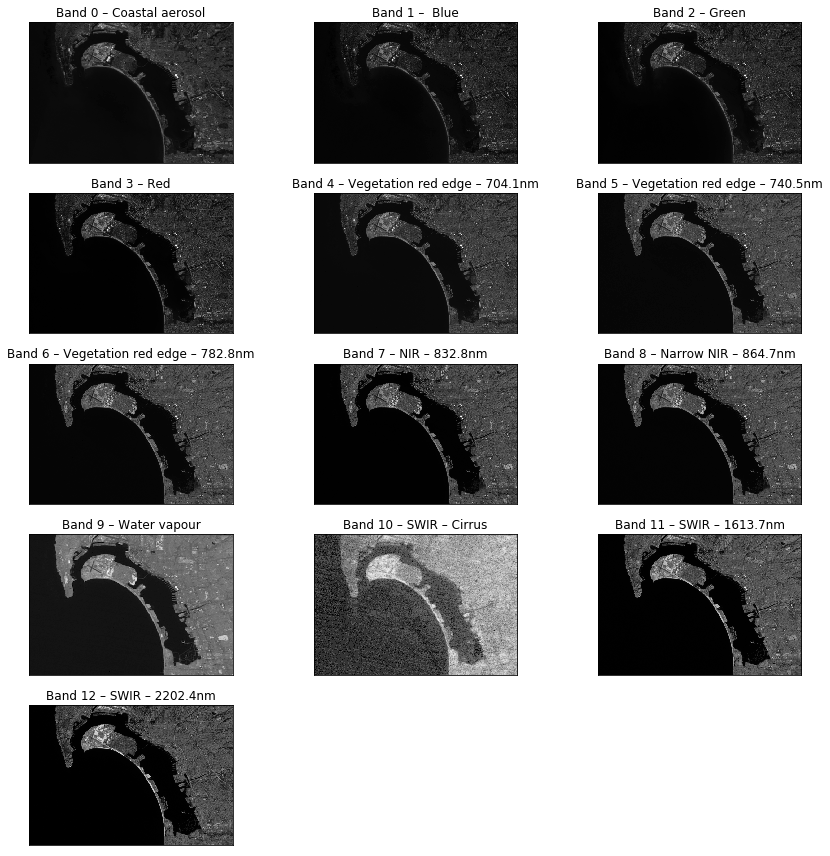

In [6]:
titles = [
    "Band 0 – Coastal aerosol",
    "Band 1 –  Blue",
    "Band 2 – Green",
    "Band 3 – Red",
    "Band 4 – Vegetation red edge – 704.1nm",
    "Band 5 – Vegetation red edge – 740.5nm",
    "Band 6 – Vegetation red edge – 782.8nm",
    "Band 7 – NIR – 832.8nm",
    "Band 8 – Narrow NIR – 864.7nm",
    "Band 9 – Water vapour",
    "Band 10 – SWIR – Cirrus",
    "Band 11 – SWIR – 1613.7nm",
    "Band 12 – SWIR – 2202.4nm",
]

# plot all bands using the earthpy function
ep.plot_bands(naip_csf, title=titles, cols=3)

(<Figure size 1728x864 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e4df6898>)

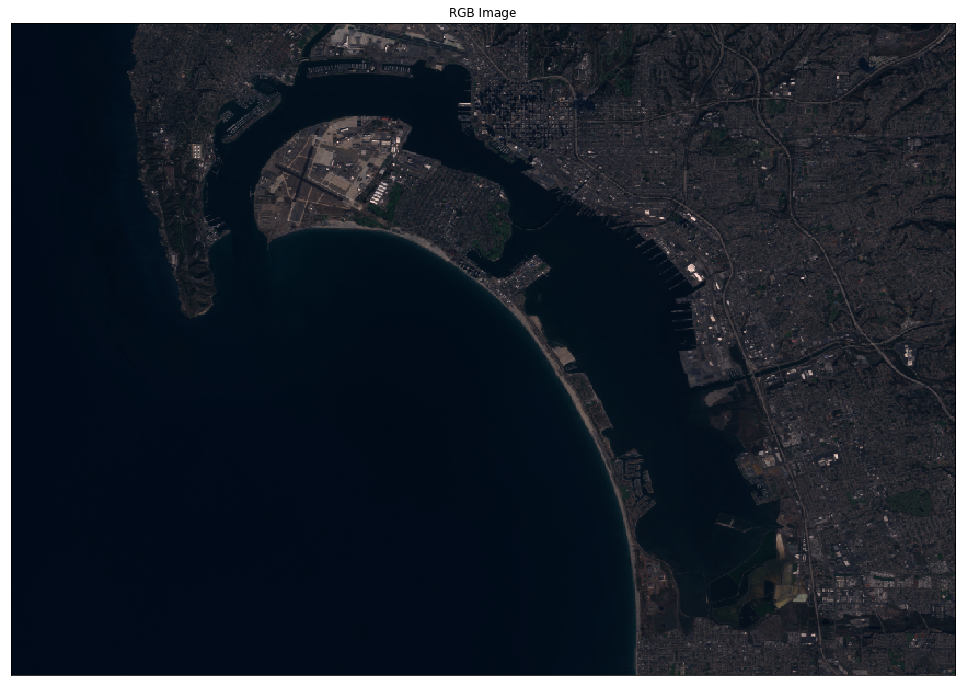

In [21]:
ep.plot_rgb(naip_csf, title="RGB Image", rgb=[3, 2, 1], figsize=(24, 12))

(<Figure size 1728x864 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e4e24e10>)

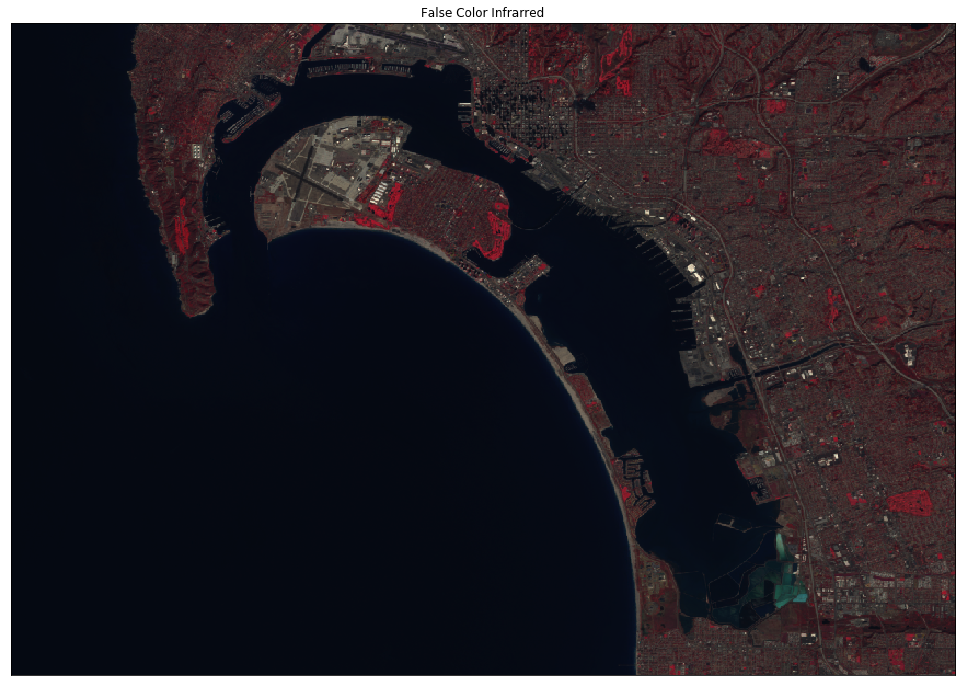

In [22]:
ep.plot_rgb(naip_csf, title="False Color Infrarred", rgb=[6, 3, 2], figsize=(24, 12))

(<Figure size 1728x864 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e4de63c8>)

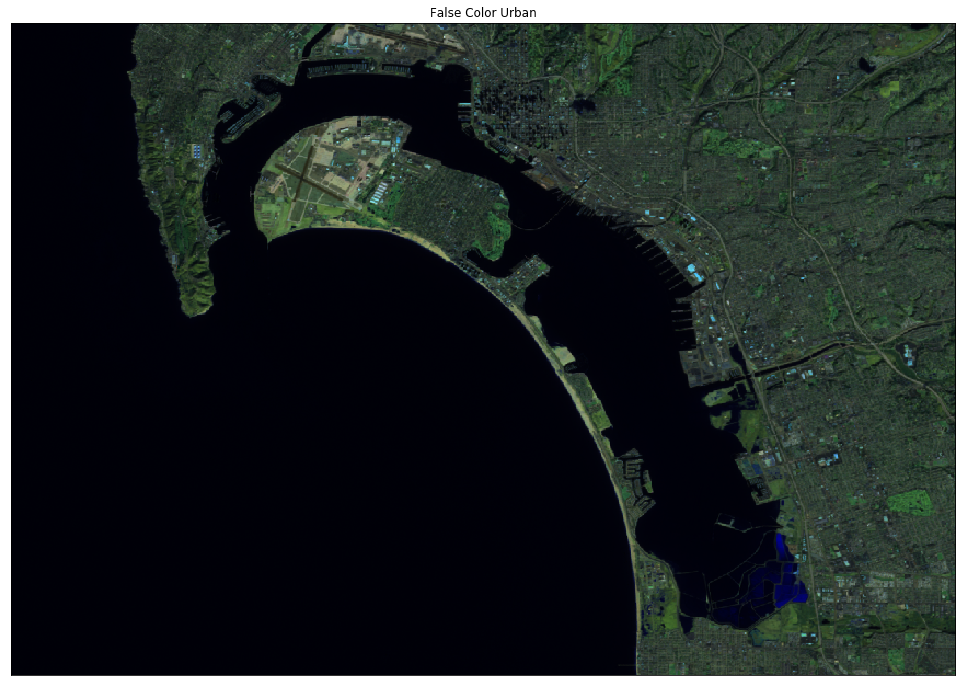

In [23]:
ep.plot_rgb(naip_csf, title="False Color Urban", rgb=[12, 11, 4], figsize=(24, 12))

(<Figure size 1728x864 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e4e452e8>)

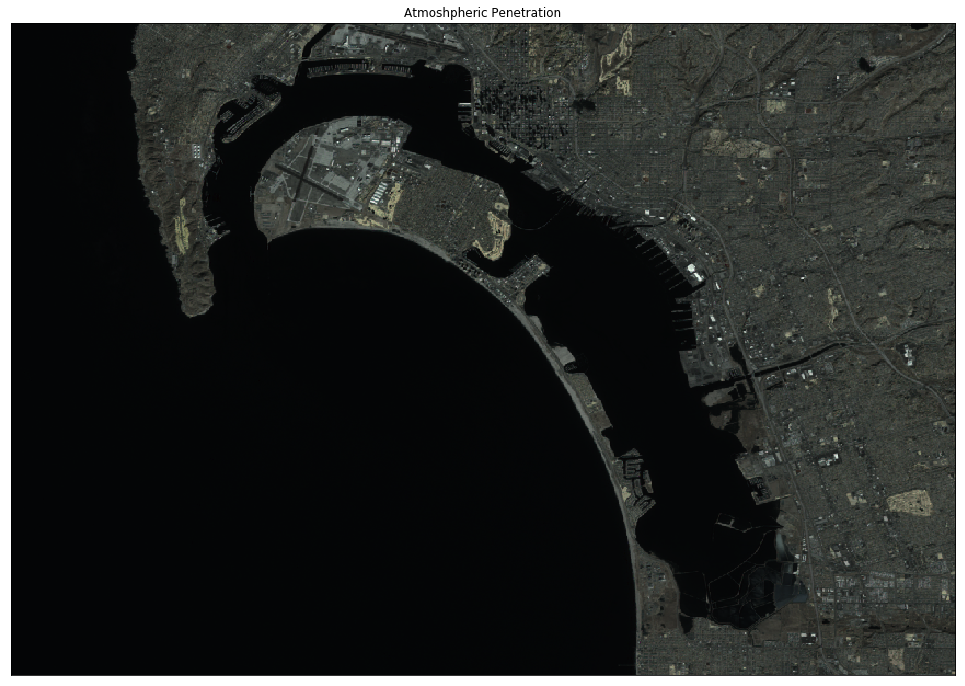

In [20]:
ep.plot_rgb(naip_csf, title="Atmoshpheric Penetration", rgb=[7, 6, 5], figsize=(24, 12))

(<Figure size 1728x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e512bb70>)

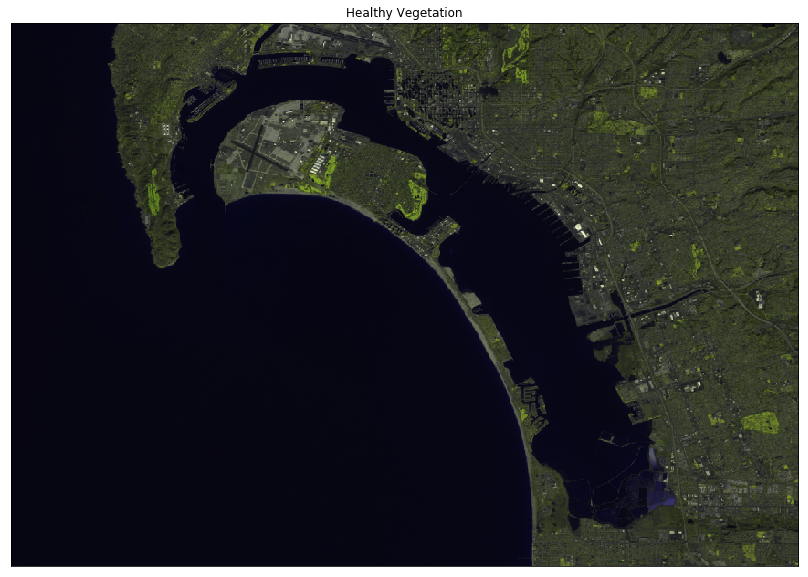

In [11]:
ep.plot_rgb(naip_csf, title="Healthy Vegetation", rgb=[5, 6, 2], figsize=(24, 10))

(<Figure size 1728x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e50ef208>)

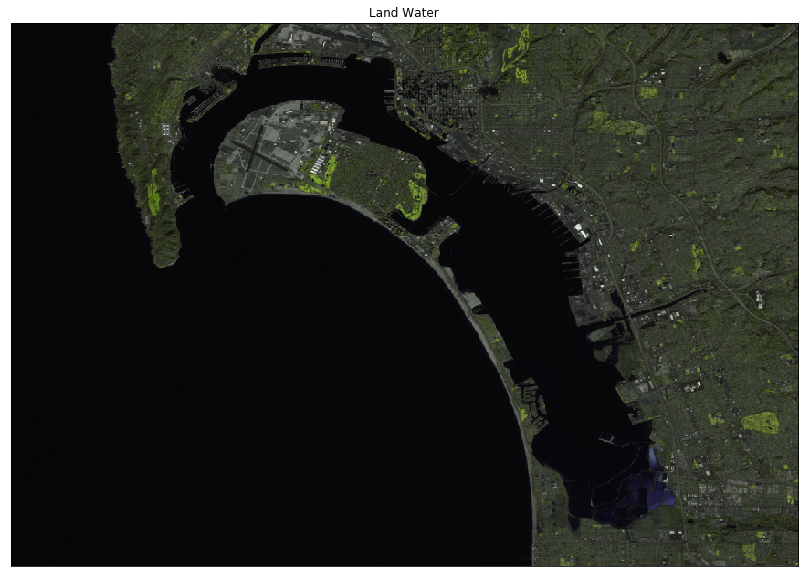

In [12]:
ep.plot_rgb(naip_csf, title="Land Water", rgb=[5, 6, 4], figsize=(24, 10))

(<Figure size 1728x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e50a4860>)

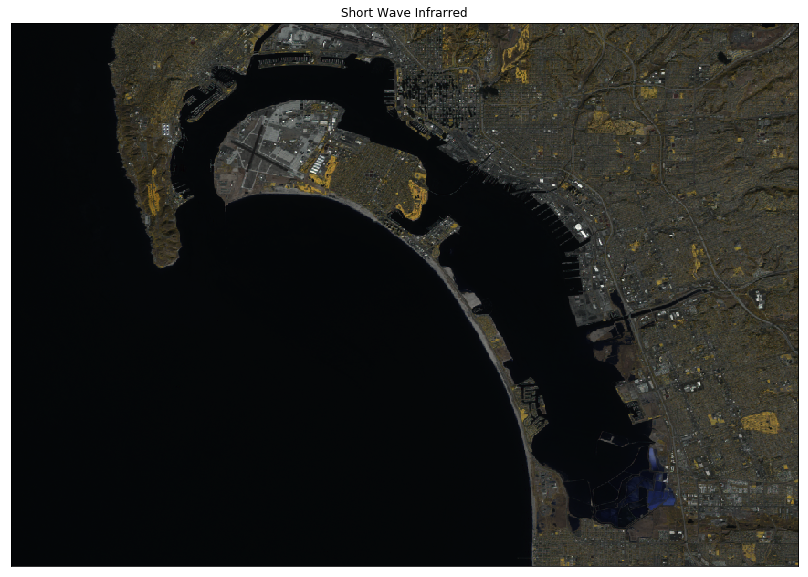

In [13]:
ep.plot_rgb(naip_csf, title="Short Wave Infrarred", rgb=[7, 5, 4], figsize=(24, 10))

(<Figure size 1728x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e5055eb8>)

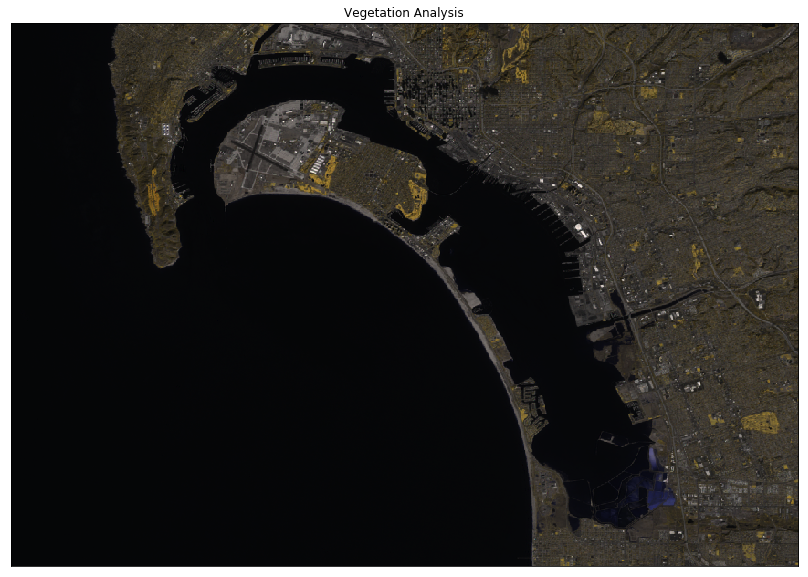

In [14]:
ep.plot_rgb(naip_csf, title="Vegetation Analysis", rgb=[6, 5, 4], figsize=(24, 10))

(<Figure size 1728x864 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f44e4fc8f60>)

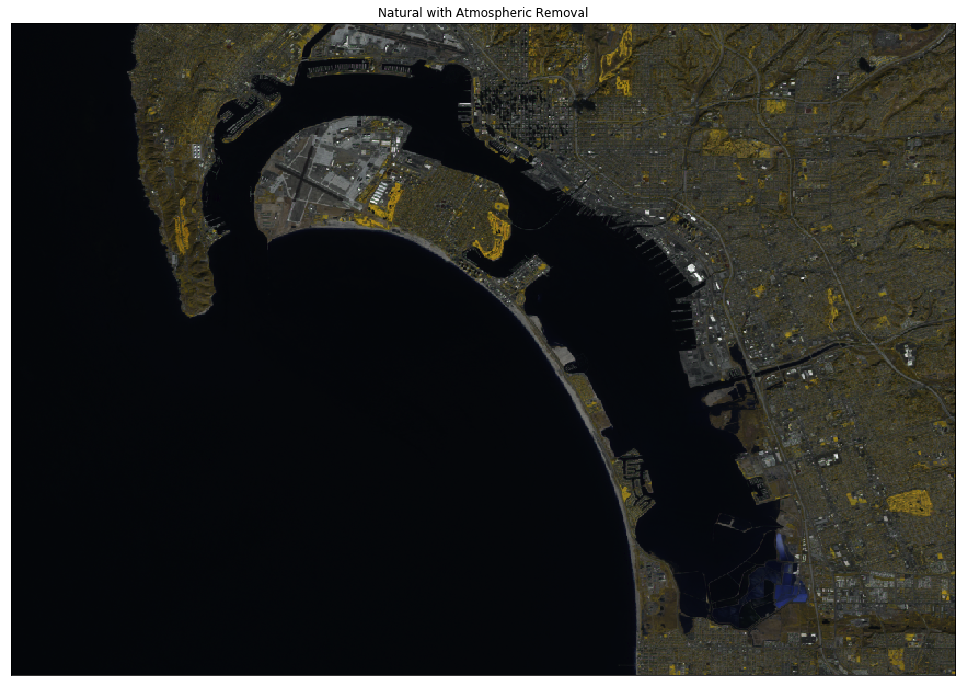

In [19]:
ep.plot_rgb(
    naip_csf, title="Natural with Atmospheric Removal", rgb=[7, 5, 3], figsize=(24, 12)
)

In [16]:
sentinel2_ndvi = (naip_csf[8] - naip_csf[3]) / (naip_csf[8] + naip_csf[3])

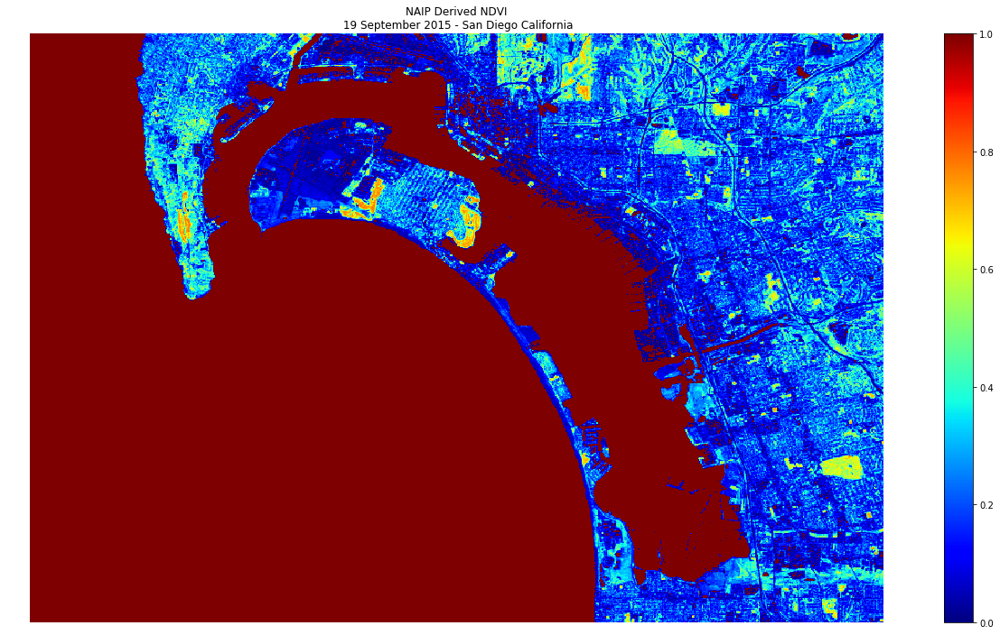

In [18]:
# Plot NDVI data
fig, ax = plt.subplots(figsize=(24, 12))
ndvi = ax.imshow(sentinel2_ndvi, cmap="jet", vmin=0, vmax=1)
fig.colorbar(ndvi, fraction=0.05)
ax.set(title="Sentinel 2 Derived NDVI\n - San Diego California")
ax.set_axis_off()
plt.show()